In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
import plotly.express as px

In [2]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [3]:
df=pd.read_csv('gurgaon_properties_cleaned_v2.csv')
df.head()

,property_type,sector_info,society,price,price_per_sqft,area,areaWithType,carpet_area,built_up_area,super_built_area,bedRoom,bathroom,balcony,floorNum,facing,agePossession,study room,store room,pooja room,others,servant room,furnishing_type,luxury_score
0,ind. house,sector 24,dlf city plots phase 3,5.00,34083.0,1467.00,Plot area 163(136.29 sq.m.),NaN,1467.0,NaN,13.0,13.0,3+,4.0,North,New Property,0,0,1,0,0,0,91
1,ind. house,sector 105,rajendra park gurgaon,0.37,10277.0,360.00,Plot area 360(33.45 sq.m.),NaN,360.0,NaN,4.0,3.0,2,3.0,East,Relatively New,0,0,0,0,0,1,0
2,flat,sector 12,ss residency,0.53,4818.0,1100.04,Super Built up area 1100(102.19 sq.m.),NaN,NaN,1100.0,3.0,3.0,2,2.0,NaN,Relatively New,0,0,0,0,0,2,14
3,flat,sector 109,ats kocoon,1.70,9742.0,1745.02,Super Built up area 1745(162.12 sq.m.)Built Up...,NaN,1550.0,1745.0,3.0,3.0,3,22.0,East,Relatively New,0,0,0,0,0,1,74
4,flat,sector 37c,corona optus,1.50,6361.0,2358.12,Super Built up area 2358(219.07 sq.m.),NaN,NaN,2358.0,3.0,4.0,3+,14.0,North-East,New Property,0,0,0,1,1,1,83


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3796 entries, 0 to 3795
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   property_type     3796 non-null   object 
 1   sector_info       3796 non-null   object 
 2   society           3241 non-null   object 
 3   price             3795 non-null   float64
 4   price_per_sqft    3795 non-null   float64
 5   area              3795 non-null   float64
 6   areaWithType      3796 non-null   object 
 7   carpet_area       1923 non-null   float64
 8   built_up_area     1778 non-null   float64
 9   super_built_area  1869 non-null   float64
 10  bedRoom           3796 non-null   float64
 11  bathroom          3796 non-null   float64
 12  balcony           3796 non-null   object 
 13  floorNum          3772 non-null   float64
 14  facing            2700 non-null   object 
 15  agePossession     3796 non-null   object 
 16  study room        3796 non-null   int64  


In [5]:
df.shape

(3796, 23)

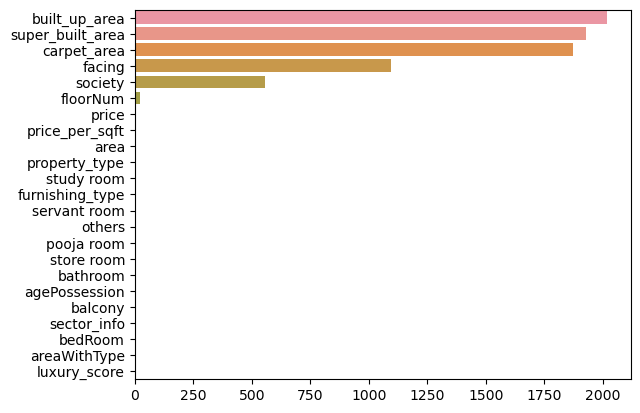

In [6]:
sns.barplot(x=df.isna().sum().sort_values(ascending=False).values,y=df.isna().sum().sort_values(ascending=False).index);

In [7]:
df['society'].replace({'.',np.nan},inplace=True)

In [8]:
property_type_distribution=df['property_type'].value_counts()
property_type_distribution

flat          2863
ind. house     933
Name: property_type, dtype: int64

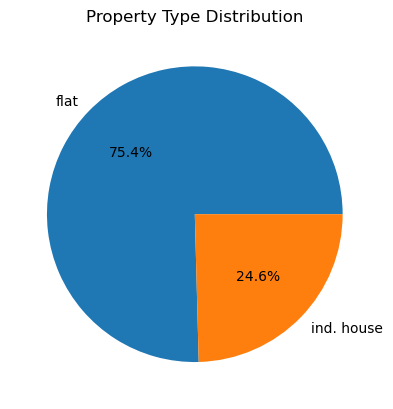

In [9]:
plt.pie(property_type_distribution.values,labels=property_type_distribution.index,autopct='%0.1f%%')
plt.title('Property Type Distribution');

The data indicates a distribution of property types, where flats and independent houses are the two categories. The pie chart shows that flats account for approximately 75.4% of the properties, while independent houses make up the remaining 24.6%

In [10]:
df['sector_info'].value_counts()

sector 35      157
sector 85      108
sector 102     107
sector 92       98
sector 69       93
sector 90       88
sector 81       87
sector 65       87
sector 109      86
sector 79       77
sector 104      75
sector 37d      73
sector 33       70
sector 48       70
sector 2        70
sector 83       68
sector 50       64
sector 86       64
sector 89       59
sector 107      59
sector 108      58
sector 56       56
sector 95       54
sector 70a      54
sector 37c      52
sector 26       51
sector 49       51
sector 70       50
sector 84       49
sector 43       48
sector 3        47
sector 67       47
sector 3a       45
sector 25       44
sector 103      44
sector 113      43
sector 66       42
sector 7        42
sector 61       41
sector 82       41
sector 27       39
sector 106      38
sector 68       34
sector 12       33
sector 57       31
sector 99a      30
sector 54       30
sector 72       29
sector 105      28
sector 11       27
sector 71       27
sector 110      27
sector 77   

In [11]:
top_20_category=df['sector_info'].value_counts()[:20]
top_20_category['others']=df['sector_info'].value_counts()[20:].sum()

In [12]:
fig = px.pie(values=top_20_category, names=top_20_category.index, title='Top 20 Sector Categories')
fig.show()

the dataset consists of 128 categories in the "sector info" column. The top 20 categories have been analyzed, and the graph shows that sector 35 has an occurrence of 4.15%, while the remaining sectors (not in the top 20) collectively account for 56% of the occurrences. 

The presence of 128 different sectors indicates a diverse dataset with a wide range of categories. This might suggest a comprehensive coverage of various sectors or industries in the data

The fact that sector 35 has an occurrence of 4.15% suggests that it is relatively uncommon compared to other sectors. This could imply that this sector might be specialized, niche, or emerging.

In [13]:
df['society'].value_counts()

tulip violet                                         75
ss the leaf                                          73
shapoorji pallonji joyville gurugram                 41
dlf new town heights                                 39
signature global park                                35
shree vardhman victoria                              34
smart world orchard                                  32
emaar mgf emerald floors premier                     32
dlf the ultima                                       31
paras dews                                           31
dlf regal gardens                                    30
shree vardhman flora                                 29
m3m woodshire                                        29
smart world gems                                     28
la vida by tata housing                              28
godrej nature plus                                   27
signature global solera                              27
bptp terra                                      

In [14]:
df['society'].isna().sum()/df.shape[0]*100

14.620653319283456

The society column contains 721 categories also society column contains 14.62% missing values and the data is having high cardinality

In [15]:
df['bedRoom'].value_counts()

3.0     1531
2.0      973
4.0      687
5.0      209
1.0      135
6.0       82
9.0       43
8.0       33
7.0       29
12.0      27
10.0      21
16.0      11
13.0       4
11.0       2
19.0       2
18.0       2
34.0       1
20.0       1
14.0       1
21.0       1
36.0       1
Name: bedRoom, dtype: int64

In [16]:
df['bedRoom'].isna().sum()

0

In [17]:
df['bedRoom']=df['bedRoom'].astype(int)

In [18]:
df['bedRoom'].value_counts()

3     1531
2      973
4      687
5      209
1      135
6       82
9       43
8       33
7       29
12      27
10      21
16      11
13       4
11       2
19       2
18       2
34       1
20       1
14       1
21       1
36       1
Name: bedRoom, dtype: int64

In [19]:
top_5_category=df['bedRoom'].value_counts()[:5]
top_5_category['others']=df['bedRoom'].value_counts()[5:].sum()

In [20]:
fig=px.pie(values=top_5_category,names=top_5_category.index,title='Frequency distribution of bedrooms')
fig.show()

In [21]:
top_10_category=df['bedRoom'].value_counts()[:10]
top_10_category['others']=df['bedRoom'].value_counts()[10:].sum()

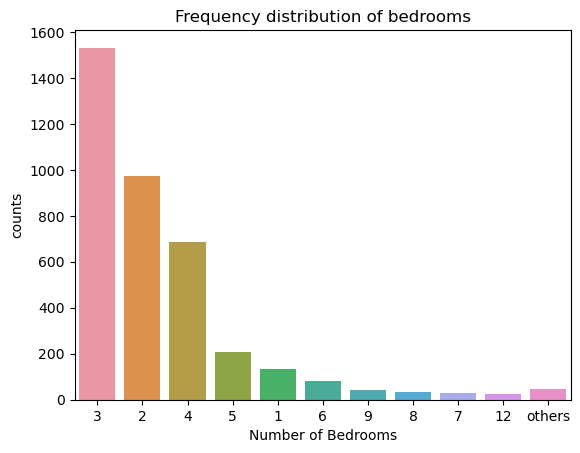

In [22]:
sns.barplot(x=top_10_category.index,y=top_10_category.values)
plt.title('Frequency distribution of bedrooms')
plt.xlabel('Number of Bedrooms')
plt.ylabel('counts');

1 Bedroom: Represents 3.56% of the data.

2 Bedroom: Represents 25.6% of the data.

3 Bedroom: Represents 40.3% of the data.

4 Bedroom: Represents 18.1% of the data.

5 Bedroom: Represents 5.51% of the data.

5+Other: Represents 6.68% of the data.

The most common bedroom type is 3 bedrooms, making up 40.3% of the data. This suggests that properties with 3 bedrooms are the most prevalent in the dataset.

The distribution of bedrooms appears to be positively skewed. The majority of properties have 1, 2, 3, or 4 bedrooms, while fewer properties have 5 bedrooms or more.

The presence of properties with 36 bedrooms might indicate potential outliers or exceptional cases that could be investigated further.



In [23]:
df['bathroom'].isna().sum()

0

In [24]:
df['bathroom']=df['bathroom'].astype(int)

In [25]:
df['bathroom'].value_counts()

3     1113
2     1092
4      837
5      296
1      168
6      121
9       41
7       40
8       26
12      21
10      11
16       7
18       4
13       4
11       4
17       3
20       3
14       2
34       1
21       1
36       1
Name: bathroom, dtype: int64

In [26]:
top_10_category=df['bathroom'].value_counts()[:10]
top_10_category['others']=df['bathroom'].value_counts()[10:].sum()

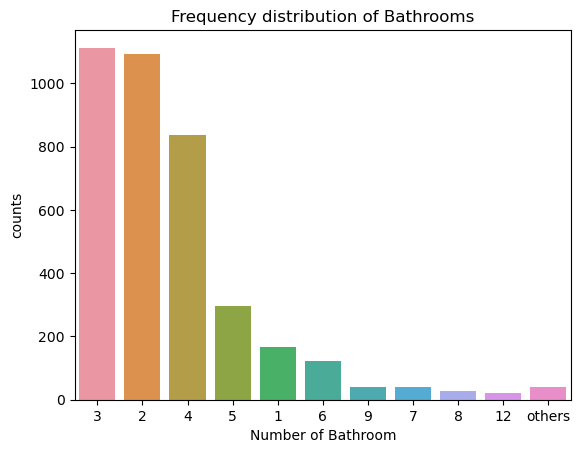

In [27]:
sns.barplot(x=top_10_category.index,y=top_10_category.values)
plt.title('Frequency distribution of Bathrooms')
plt.xlabel('Number of Bathroom')
plt.ylabel('counts');

In [28]:
top_5_category=df['bathroom'].value_counts()[:5]
top_5_category['others']=df['bathroom'].value_counts()[5:].sum()

In [29]:
fig=px.pie(values=top_5_category,names=top_5_category.index,title='Frequency distribution of bathroom')
fig.show()

1 Bathroom: Represents 4.43% of the data.

2 Bathroom: Represents 28.8% of the data.

3 Bathroom: Represents 29.3% of the data.

4 Bathroom: Represents 22% of the data.

5 Bathroom: Represents 7.8% of the data.

5+Other: Represents 7.64% of the data.

The most common bathroom type is 3 bathrooms, making up 29.3% of the data. This suggests that properties with 3 bathrooms are the most prevalent in the dataset.

The distribution of bathrooms appears to be positively skewed. The majority of properties have 1, 2, 3, or 4 bathrooms, while fewer properties have 5 bathrooms or more.

The presence of properties with 36 bathrooms might indicate potential outliers or exceptional cases that could be investigated further.

In [30]:
df['balcony'].isna().sum()

0

In [31]:
df['balcony']=df['balcony'].str.strip()

In [32]:
df['balcony'].value_counts()

3+    1179
3     1094
2      921
1      406
0      196
Name: balcony, dtype: int64

In [33]:
fig=px.pie(values=df['balcony'].value_counts(),names=['3+ Balcony','3 Balcony','2 Balcony','1 Balcony','No balcony'])
fig.show();

The distribution of balcony types in the dataset is as follows:

3+ balcony: 31.1%

3 balcony: 28.8%

2 balcony: 24.3%

1 balcony: 10.7%

No balcony: 5.16%

The most prevalent balcony type is "3+ balcony," accounting for 31.1% of the dataset. This suggests that a significant portion of the properties have a higher number of balconies.

The presence of multiple balcony types with significant percentages indicates variability in the data. This suggests that properties with various numbers of balconies are represented in the dataset.

The relatively high percentages of "3+ balcony" and "3 balcony" categories indicate a trend towards properties with more balconies. This could imply a preference for properties with larger outdoor spaces.

While the "0 balcony" category accounts for 5.16% of the dataset, it still represents a noteworthy portion. Properties without balconies might have their own market segment or could be in areas with space limitations.

It's reasonable to assume that properties with more balconies might be larger or more upscale, which could impact their value.

In [34]:
df['study room'].value_counts()

0    3087
1     709
Name: study room, dtype: int64

In [35]:
fig=px.pie(values=df['study room'].value_counts(),names=['No','yes'],title='Study room availabilty')
fig.show();

18.7% percent data has study room available however 81.3% does not have study room 

In [36]:
df['store room'].value_counts()

0    3446
1     350
Name: store room, dtype: int64

In [37]:
fig=px.pie(values=df['store room'].value_counts(),names=['No','yes'],title='Store room availabilty')
fig.show();

9.22% percent data has store room available however 90.8% does not have store room

In [38]:
df['servant room'].value_counts()

0    2462
1    1334
Name: servant room, dtype: int64

In [39]:
fig=px.pie(values=df['servant room'].value_counts(),names=['No','yes'],title='Servant room availabilty')
fig.show();

35.1% percent data has servant room available however 64.9% does not have servant room

In [40]:
df['others'].value_counts()

0    3379
1     417
Name: others, dtype: int64

In [41]:
fig=px.pie(values=df['others'].value_counts(),names=['No','yes'],title='others room availabilty')
fig.show();

11% percent data has a extra room available however 89% does not have extra room

In [42]:
df['pooja room'].value_counts()

0    3127
1     669
Name: pooja room, dtype: int64

In [43]:
fig=px.pie(values=df['pooja room'].value_counts(),names=['No','yes'],title='pooja room availabilty')
fig.show();

17.6% percent data has Pooja room available however 82.4% does not have pooja room

In [44]:
df['furnishing_type'].value_counts()

1    2512
2    1071
0     213
Name: furnishing_type, dtype: int64

In [45]:
fig=px.pie(values=df['furnishing_type'].value_counts(),names=['semifurnish','full furnish','No furnish'],title='furnishing details')
fig.show();

66.2% data belongs to semifurnish flat and house and 28.2% data belongs to full furnish flats and houses however No furnish houses has 5.61% contribution in data 

In [46]:
df['agePossession'].value_counts()

Relatively New        1665
New Property           608
Moderately old         588
old Property           341
undefined              325
Under construction     269
Name: agePossession, dtype: int64

In [47]:
df['agePossession'].isna().sum()

0

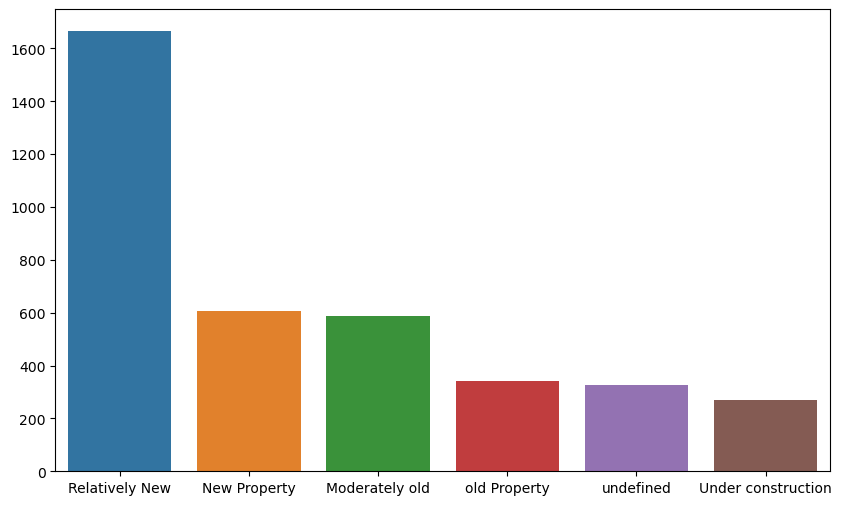

In [48]:
plt.figure(figsize=(10,6))
sns.barplot(x=df['agePossession'].value_counts().index,y=df['agePossession'].value_counts().values);

In [49]:
fig=px.pie(values=df['agePossession'].value_counts(),names=df['agePossession'].value_counts().index,title='Property possession status')
fig.show()

From the data it seems that property which has been built before 1 to 5 years has more prevalent in the dataset.

Also property which are built in next 3 month or built before 1 year has 16% contribution in data.In combine almost 60% data has new property which are ranging from 1year old to 5 year old

Their are some property which are built before 5 to 10 years and has 15.5% contribution

underconstruction property has 7% contribution

10+ Year old property are very few 8.98%

In [50]:
df['facing'].isna().sum()/df.shape[0]*100

28.87249736564805

In [51]:
df['facing'].value_counts()

East          647
North-East    643
North         396
West          248
South         234
North-West    197
South-East    180
South-West    155
Name: facing, dtype: int64

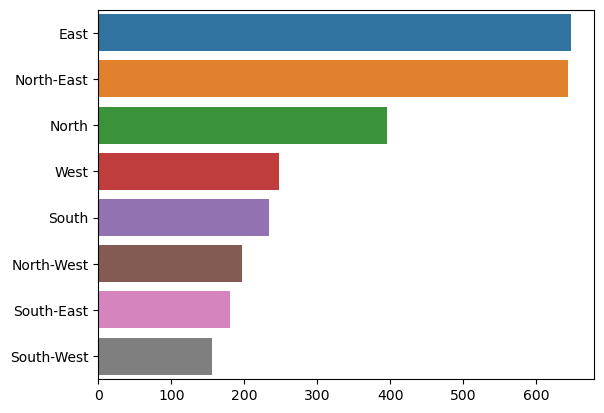

In [52]:
sns.barplot(x=df['facing'].value_counts().values,y=df['facing'].value_counts().index);

In [53]:
fig=px.pie(values=df['facing'].value_counts(),names=df['facing'].value_counts().index,title='facing count')
fig.show()

It seems that East,North-East,North facing home has more prevelant in dataset.

1) East: 24% data belong to east facing homes

2) North- East: 23.8% data belong to North East facing homes

3) North : 14.7 percent data belong to north facing home

4) West : 9.19 percent homes belong to west facing homes

5) south,North-west,South-East,South-West has 8.67%,7.3%,6.67% and 5.74% contribution in data

Data has almost 29% missing values.



In [54]:
df.head()

,property_type,sector_info,society,price,price_per_sqft,area,areaWithType,carpet_area,built_up_area,super_built_area,bedRoom,bathroom,balcony,floorNum,facing,agePossession,study room,store room,pooja room,others,servant room,furnishing_type,luxury_score
0,ind. house,sector 24,dlf city plots phase 3,5.00,34083.0,1467.00,Plot area 163(136.29 sq.m.),NaN,1467.0,NaN,13,13,3+,4.0,North,New Property,0,0,1,0,0,0,91
1,ind. house,sector 105,rajendra park gurgaon,0.37,10277.0,360.00,Plot area 360(33.45 sq.m.),NaN,360.0,NaN,4,3,2,3.0,East,Relatively New,0,0,0,0,0,1,0
2,flat,sector 12,ss residency,0.53,4818.0,1100.04,Super Built up area 1100(102.19 sq.m.),NaN,NaN,1100.0,3,3,2,2.0,NaN,Relatively New,0,0,0,0,0,2,14
3,flat,sector 109,ats kocoon,1.70,9742.0,1745.02,Super Built up area 1745(162.12 sq.m.)Built Up...,NaN,1550.0,1745.0,3,3,3,22.0,East,Relatively New,0,0,0,0,0,1,74
4,flat,sector 37c,corona optus,1.50,6361.0,2358.12,Super Built up area 2358(219.07 sq.m.),NaN,NaN,2358.0,3,4,3+,14.0,North-East,New Property,0,0,0,1,1,1,83


In [55]:
df['price'].describe()

count    3795.00000
mean        2.50586
std         2.95681
min         0.08000
25%         0.92000
50%         1.50000
75%         2.70000
max        31.50000
Name: price, dtype: float64

In [56]:
df['price'].skew()

3.2958387954141513

In [57]:
df['price'].kurt()

15.116195696166255

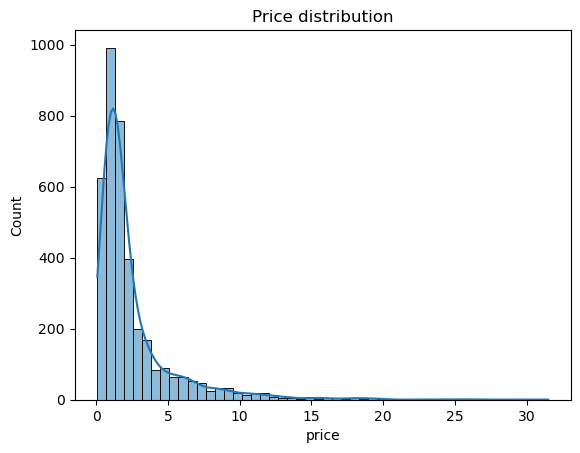

In [58]:
sns.histplot(df['price'],bins=50,kde=True)
plt.title('Price distribution');

C:\Users\kapil\AppData\Local\Temp\ipykernel_18088\1752442663.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='price', ylabel='Density'>

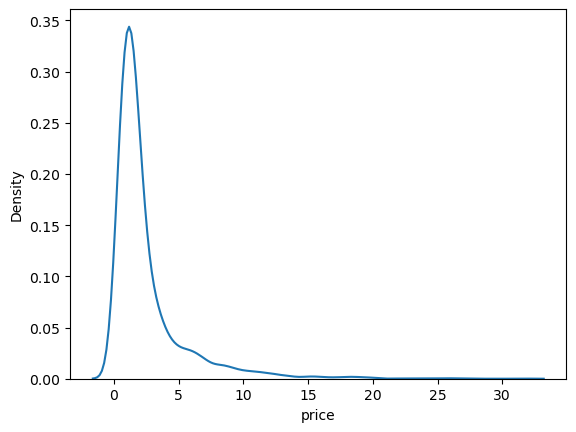

In [59]:
sns.distplot(a=df['price'], hist=False)

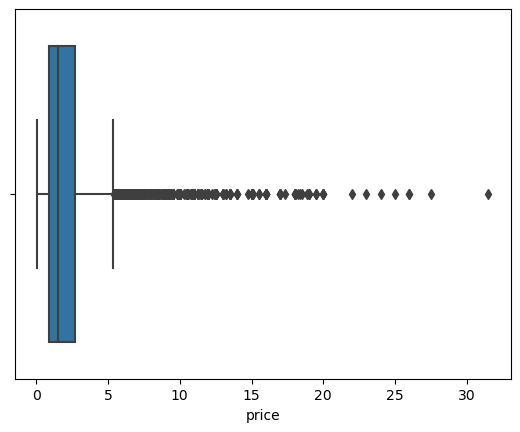

In [60]:
sns.boxplot(x=df['price']);

In [61]:
iqr_range=df['price'].quantile(0.75)-df['price'].quantile(0.25)
upper_range=df['price'].quantile(0.75)+1.5*iqr_range
# lower_range=df['price'].quantile(0.25)-1.5*iqr_range
print('Values after {} can be consider as a potiential outliers'.format(round(upper_range,2)))

Values after 5.37 can be consider as a potiential outliers


In [62]:
df['price'].quantile([0.01,0.05,0.1,0.95,0.99])

0.01     0.250
0.05     0.370
0.10     0.500
0.95     8.493
0.99    15.124
Name: price, dtype: float64

In [63]:
price_outliers_df=df[df['price']>5.37]

In [64]:
price_outliers_df.shape

(438, 23)

In [65]:
price_outliers_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 438 entries, 6 to 3788
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   property_type     438 non-null    object 
 1   sector_info       438 non-null    object 
 2   society           286 non-null    object 
 3   price             438 non-null    float64
 4   price_per_sqft    438 non-null    float64
 5   area              438 non-null    float64
 6   areaWithType      438 non-null    object 
 7   carpet_area       98 non-null     float64
 8   built_up_area     376 non-null    float64
 9   super_built_area  47 non-null     float64
 10  bedRoom           438 non-null    int32  
 11  bathroom          438 non-null    int32  
 12  balcony           438 non-null    object 
 13  floorNum          429 non-null    float64
 14  facing            362 non-null    object 
 15  agePossession     438 non-null    object 
 16  study room        438 non-null    int64  
 

In [66]:
price_outliers_df['price'].describe()

count    438.000000
mean       9.171324
std        4.051152
min        5.400000
25%        6.400000
50%        8.000000
75%       10.550000
max       31.500000
Name: price, dtype: float64

Outliers Analysis of price column

1) Data is having a mean of 9.17 Crore

2) outlier range is from 5.4 crore to 31.5 crore

3) Their are 438 properties can be consider as a outliers and need further investigation.


In [67]:
price_outliers_df

,property_type,sector_info,society,price,price_per_sqft,area,areaWithType,carpet_area,built_up_area,super_built_area,bedRoom,bathroom,balcony,floorNum,facing,agePossession,study room,store room,pooja room,others,servant room,furnishing_type,luxury_score
6,ind. house,sector 66,emaar mgf marbella,18.00,55556.0,3240.00,Plot area 360(301.01 sq.m.),NaN,3240.0,NaN,4,4,3+,3.0,East,Moderately old,1,0,1,0,1,0,75
8,ind. house,sector 26,dlf city plots,13.50,29880.0,4518.00,Plot area 502(419.74 sq.m.),NaN,4518.0,NaN,5,5,3,2.0,East,old Property,1,1,1,0,1,2,110
19,ind. house,sector 25,floor wise designer kothi,13.00,48148.0,2700.00,Plot area 300(250.84 sq.m.),NaN,2700.0,NaN,12,16,3+,4.0,North-East,New Property,1,1,1,0,1,2,144
34,flat,sector 43,beverley park 1,8.44,16230.0,5200.25,Super Built up area 5200(483.1 sq.m.)Built Up ...,4900.0,5000.0,5200.0,4,5,3,9.0,North-East,Moderately old,0,0,0,0,1,0,117
44,ind. house,sector 70a,bptp visionnaire,5.40,20690.0,2610.00,Plot area 290(242.48 sq.m.),NaN,2610.0,NaN,4,5,3+,3.0,North,Relatively New,1,1,1,0,1,2,136
53,ind. house,sector 43,NaN,13.50,50000.0,2700.00,Plot area 300(250.84 sq.m.),NaN,2700.0,NaN,16,16,3+,4.0,North-West,Relatively New,1,0,1,1,1,1,41
68,ind. house,sector 43,sushant lok 1 builder floors,6.25,30728.0,2034.00,Plot area 226(188.96 sq.m.),NaN,2034.0,NaN,7,7,3+,3.0,North,Moderately old,1,1,0,0,1,1,46
72,ind. house,sector 23,NaN,5.65,17706.0,3191.00,Plot area 342(285.96 sq.m.)Built Up area: 5000...,36000.0,3078.0,NaN,7,7,3+,2.0,West,Moderately old,0,0,1,0,1,1,68
86,ind. house,sector 17b,NaN,7.20,15926.0,4521.00,Plot area 420,NaN,NaN,NaN,4,4,2,1.0,NaN,old Property,0,1,0,0,1,1,0
95,ind. house,sector 7,NaN,6.50,15046.0,4320.00,Plot area 480(401.34 sq.m.),NaN,4320.0,NaN,3,2,3+,NaN,NaN,old Property,0,0,0,0,0,1,9


<Axes: >

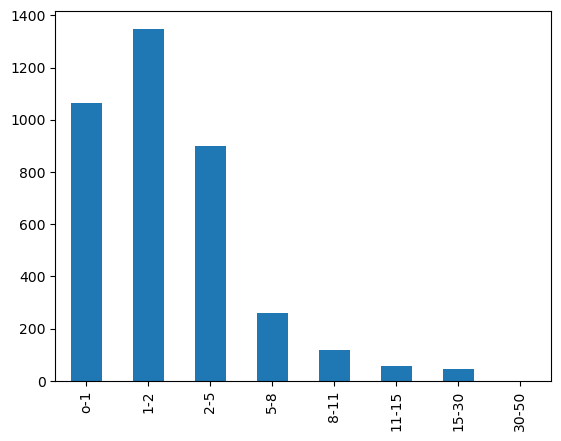

In [68]:
bins=[0,1,2,5,8,11,15,30,50]
bin_labels=['o-1','1-2','2-5','5-8','8-11','11-15','15-30','30-50']
pd.cut(df['price'],bins=bins,labels=bin_labels,right=False).value_counts().sort_index().plot(kind='bar')

Seems that their is significant drop after 5 crore

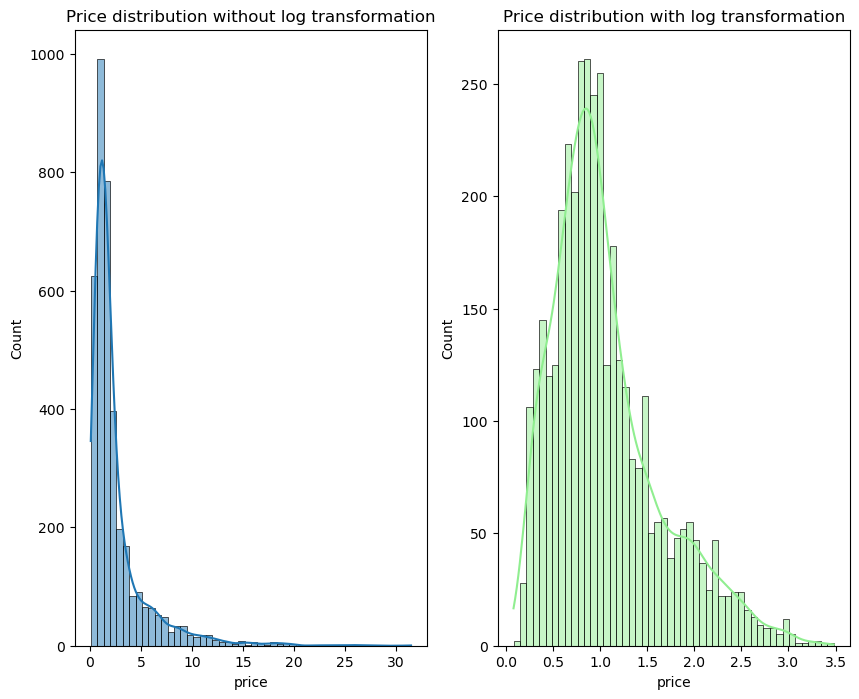

In [69]:
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
sns.histplot(df['price'],bins=50,kde=True)
plt.title('Price distribution without log transformation')

plt.subplot(1,2,2)
sns.histplot(np.log1p(df['price']),bins=50,kde=True,color='lightgreen')
plt.title('Price distribution with log transformation');

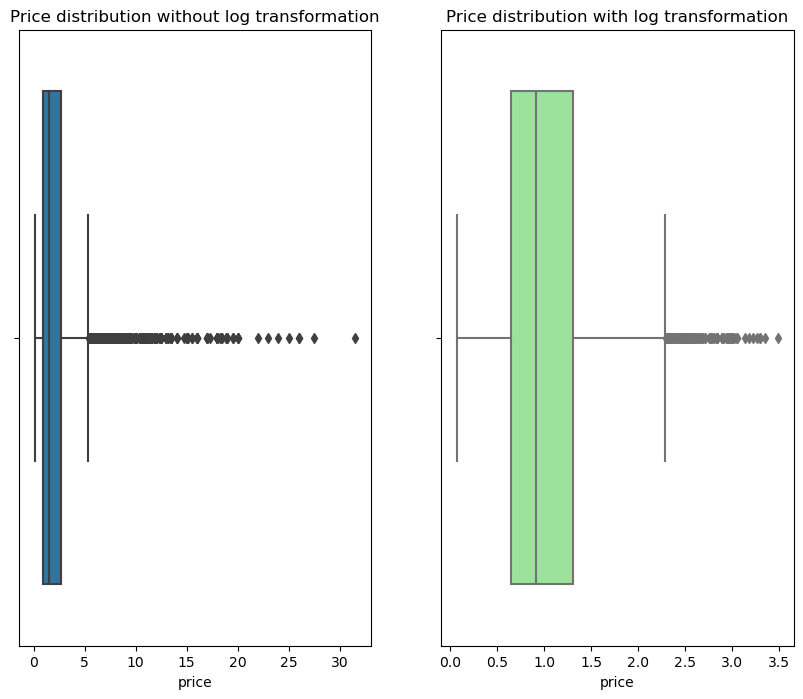

In [70]:
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
sns.boxplot(x=df['price'])
plt.title('Price distribution without log transformation')

plt.subplot(1,2,2)
sns.boxplot(x=np.log1p(df['price']),color='lightgreen')
plt.title('Price distribution with log transformation');

From the statstical summery

 1) Price column contains 3795 Non-Null values
 
 2) Mean of the data is 2.5 crore and standard deviation is 2.95 crore shows that data is widely spred 
 
 3) From high s.d. it seem that their are some higher values present in the data which are causing high mean and high sd
 
 4) Range of data is seems between 0.08 to 31.5 Crore
 
 5) Almost 75 percent data seems to in between 0.92 crore to 2.7 crore
 
 7) from the skewness factor it seems that data is highly right skew or positively skew
 
 8) High kurtosis value represent potential outliers are present in data
 
 9) Values after 5.37 can be consider as a potiential outliers
 

In [71]:
df['price_per_sqft'].isna().sum()

1

In [72]:
df['price_per_sqft'].describe()

count      3795.000000
mean      14028.239789
std       23394.942784
min           2.000000
25%        6809.500000
50%        9011.000000
75%       13872.500000
max      600000.000000
Name: price_per_sqft, dtype: float64

In [73]:
df['price_per_sqft'].skew()

10.978295185653902

In [74]:
df['price_per_sqft'].kurt()

175.3358780285837

In [75]:
df['price_per_sqft'].quantile([0.01,0.05,0.1,0.9,0.95,0.99])

0.01     3157.64
0.05     4678.60
0.10     5427.20
0.90    24212.80
0.95    33354.30
0.99    93178.42
Name: price_per_sqft, dtype: float64

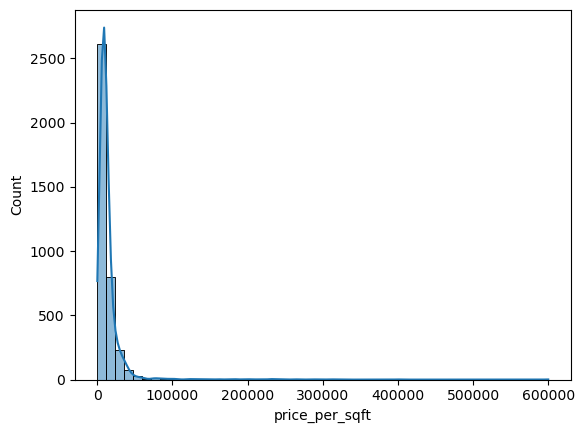

In [80]:
sns.histplot(df['price_per_sqft'],kde=True,bins=50);

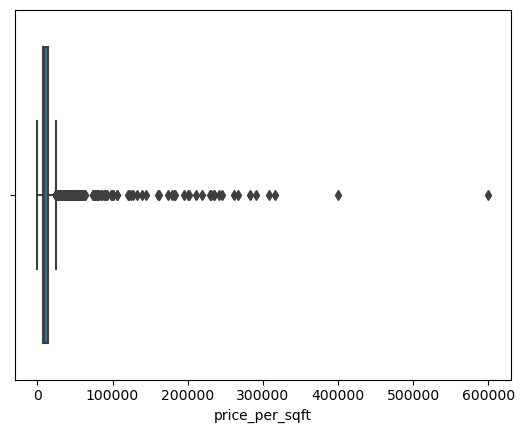

In [77]:
sns.boxplot(x=df['price_per_sqft']);

In [78]:
iqr=df['price_per_sqft'].quantile(0.75)-df['price_per_sqft'].quantile(0.25)
upper_range=df['price_per_sqft'].quantile(0.75)+1.5*iqr
upper_range

24467.0

1) thier is 1 missing value and 3795 non null values present in price_per_sqft column

2) 14028 is the mean value

3) 23394 is a sd which is pretty high which shows that their are higher value present in the data which are impacting our mean

4) range of data is ranging from 2 to 600000 show that wide range of data is available

5) most of the data is ranging between 6809,13872

6) Data is showing skewness of 10 Which shows that data is highly skew to the right. i.e. Positively skew

7) high kurtosis shows that their is potential outliers present inside the data

8) With iqr method data above 24467 can be consider as outlier and need further investigation

9) Almost 90 percent data lies below 24212 and 1 percent data is lies below 3157

In [86]:
price_per_sqft_outliers_df=df[df['price_per_sqft']>24467]

In [87]:
price_per_sqft_outliers_df['price_per_sqft'].describe()

count       371.000000
mean      53737.811321
std       60660.260648
min       24489.000000
25%       28249.500000
50%       33951.000000
75%       43899.500000
max      600000.000000
Name: price_per_sqft, dtype: float64

Outlier analysis

1) Data is having a mean of 53737.81

2) outlier range is from 24489 to 600000

3) Their are 371 properties can be consider as a outliers and need further investigation

4) 75% outliers are lies below 43899

<Axes: >

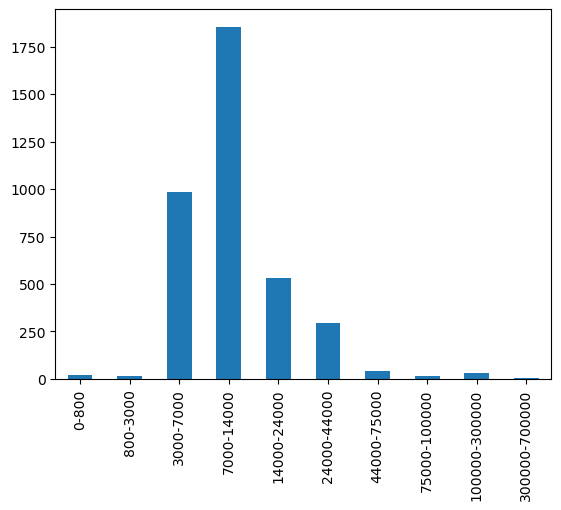

In [96]:
bins=[0,800,3000,7000,14000,24000,44000,75000,100000,300000,700000]

bin_labels=['0-800','800-3000','3000-7000','7000-14000','14000-24000','24000-44000','44000-75000','75000-100000','100000-300000','300000-700000']
pd.cut(df['price_per_sqft'],bins=bins,labels=bin_labels,right=False).value_counts().sort_index().plot(kind='bar')

most of the data is ranging between 3000 to 44000 

Their is drastic change in data after 44000

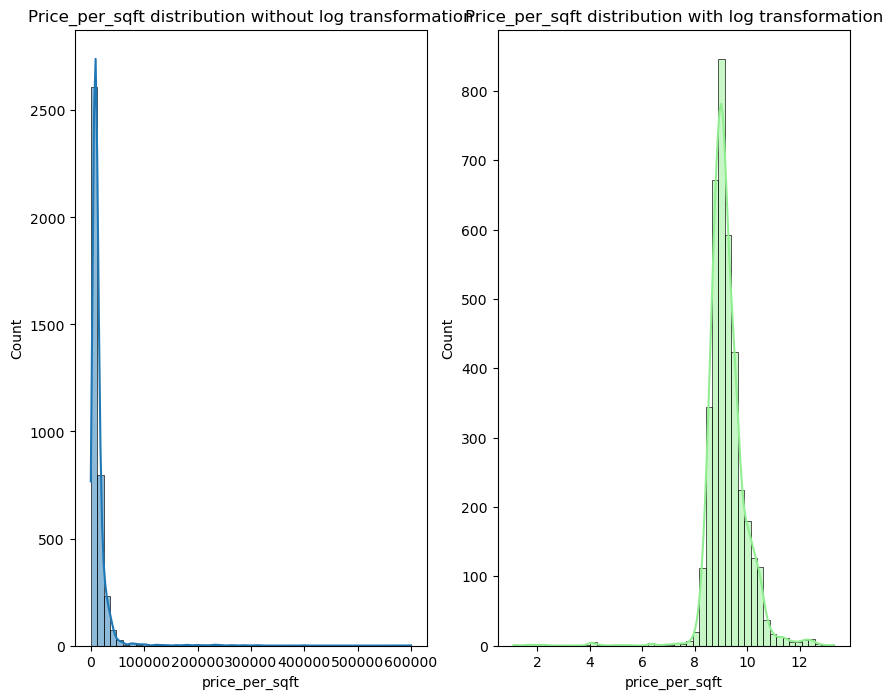

In [105]:
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
sns.histplot(df['price_per_sqft'],bins=50,kde=True)
plt.title('Price_per_sqft distribution without log transformation')

plt.subplot(1,2,2)
sns.histplot(np.log1p(df['price_per_sqft']),bins=50,kde=True,color='lightgreen')
plt.title('Price_per_sqft distribution with log transformation');

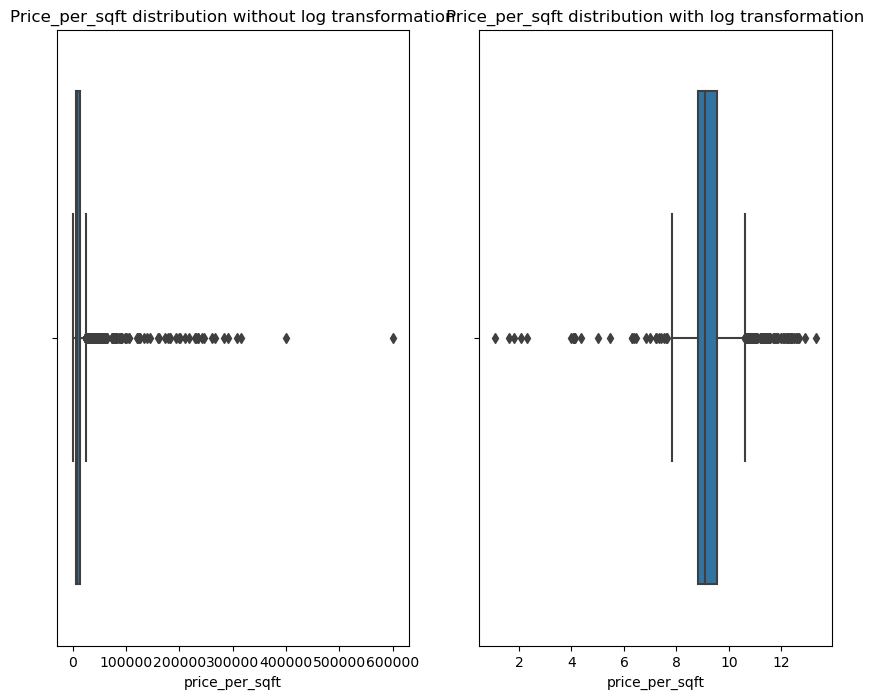

In [102]:
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
sns.boxplot(x=df['price_per_sqft'])
plt.title('Price_per_sqft distribution without log transformation')

plt.subplot(1,2,2)
sns.boxplot(x=np.log1p(df['price_per_sqft']))
plt.title('Price_per_sqft distribution with log transformation');

log transformation will help somewhat but need further analysis for deciding base of log transformation

In [130]:
df[['area','carpet_area','built_up_area','super_built_area']].isna().sum()

area                   1
carpet_area         1873
built_up_area       2018
super_built_area    1927
dtype: int64

In [131]:
df[['area','carpet_area','built_up_area','super_built_area']].describe()

,area,carpet_area,built_up_area,super_built_area
count,3795.00,1923.00,1778.00,1869.00
mean,4764.52,2763.35,7385.62,1926.78
std,119825.04,22738.63,207303.86,760.26
min,45.00,0.00,0.00,325.00
25%,1200.00,900.00,1176.00,1480.00
50%,1717.01,1340.00,1700.00,1828.00
75%,2296.10,1800.00,2430.00,2215.00
max,7250000.00,607935.00,8711999.00,10000.00


In [119]:
pd.options.display.float_format = '{:.2f}'.format
df['area'].describe()

count      3795.00
mean       4764.52
std      119825.04
min          45.00
25%        1200.00
50%        1717.01
75%        2296.10
max     7250000.00
Name: area, dtype: float64

In [132]:
df[['area','carpet_area','built_up_area','super_built_area']].skew()

area               58.50
carpet_area        23.91
built_up_area      41.73
super_built_area    1.89
dtype: float64

In [133]:
df[['area','carpet_area','built_up_area','super_built_area']].kurt()

area               3526.91
carpet_area         593.99
built_up_area      1752.37
super_built_area     10.58
dtype: float64

<Axes: xlabel='area', ylabel='Count'>

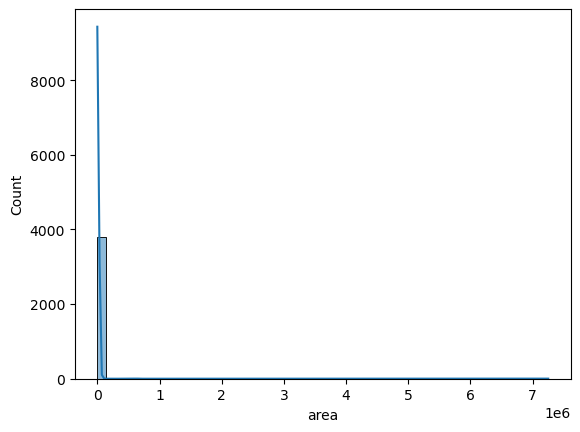

In [122]:
sns.histplot(df['area'],bins=50,kde=True)

<Axes: xlabel='super_built_area'>

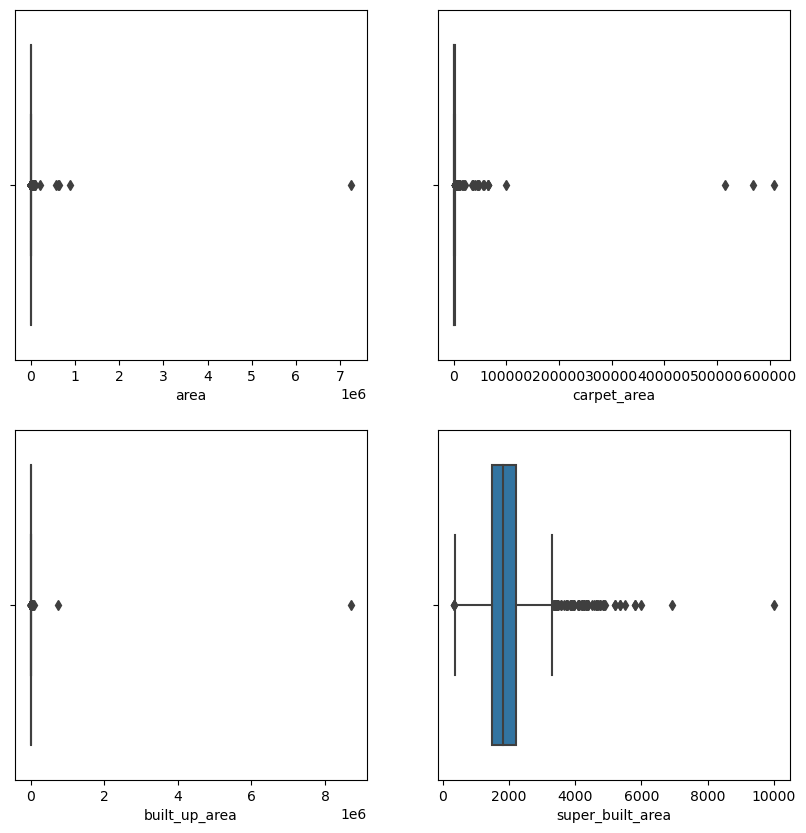

In [139]:
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
sns.boxplot(x=df['area'])
plt.subplot(2,2,2)
sns.boxplot(x=df['carpet_area'])
plt.subplot(2,2,3)
sns.boxplot(x=df['built_up_area'])
plt.subplot(2,2,4)
sns.boxplot(x=df['super_built_area'])

In [140]:
df[['area','carpet_area','built_up_area','super_built_area']].quantile([0.01,0.05,0.1,0.9,0.95,0.99])

,area,carpet_area,built_up_area,super_built_area
0.01,191.88,65.00,73.85,551.40
0.05,500.00,481.10,450.00,800.00
0.10,635.19,554.00,603.00,1214.00
0.90,3198.16,2489.20,3600.00,2800.00
0.95,4258.78,3155.40,4518.00,3175.00
0.99,8252.22,17540.76,8000.00,4637.76


In [143]:
iqr=df[['area','carpet_area','built_up_area','super_built_area']].quantile(0.75)-df[['area','carpet_area','built_up_area','super_built_area']].quantile(0.25)
upper_range=df[['area','carpet_area','built_up_area','super_built_area']].quantile(0.75)+1.5*iqr
upper_range

area               3940.25
carpet_area        3150.00
built_up_area      4311.00
super_built_area   3317.50
dtype: float64

Area:

    1) Their is only 1 missing value present and 3795 non null values
    2) Mean is 4764 and it is highly influesnce by higher sd which is 1,19825
    3) Most of the data is ranging between 1200 to 2300 sqft
    4) High skewness value shows that data is right skew 
    5) Very high kurtosis value 3526 shows too much outliers present in data and it is impacting our analysis
    6)data above 3940 can be a potential outliers inside the data
same pattern seems in carpet area,super built are and built up area these  column contains to much missinf value need to further investigate these column
    
    

In [145]:
df[(df['area']>3940)&(df['carpet_area']>3150) & (df['built_up_area']>4311) & (df['super_built_area']>3317.5)]

,property_type,sector_info,society,price,price_per_sqft,area,areaWithType,carpet_area,built_up_area,super_built_area,bedRoom,bathroom,balcony,floorNum,facing,agePossession,study room,store room,pooja room,others,servant room,furnishing_type,luxury_score
34,flat,sector 43,beverley park 1,8.44,16230.00,5200.25,Super Built up area 5200(483.1 sq.m.)Built Up ...,4900.00,5000.00,5200.00,4,5,3,9.00,North-East,Moderately old,0,0,0,0,1,0,117
3190,flat,sector 108,raheja vedas,2.15,4134.00,5200.77,Super Built up area 5200(483.1 sq.m.)Built Up ...,4000.00,4600.00,5200.00,3,4,3+,12.00,East,Relatively New,1,0,0,0,0,1,0
3404,flat,sector 102,adani m2k oyster grande,4.55,10000.00,4550.00,Super Built up area 4650(432 sq.m.)Built Up ar...,4550.00,4630.00,4650.00,4,4,3+,11.00,North-East,Relatively New,0,0,0,0,0,2,60


In [146]:
df['area'].describe()

count      3795.00
mean       4764.52
std      119825.04
min          45.00
25%        1200.00
50%        1717.01
75%        2296.10
max     7250000.00
Name: area, dtype: float64

In [147]:
df

,property_type,sector_info,society,price,price_per_sqft,area,areaWithType,carpet_area,built_up_area,super_built_area,bedRoom,bathroom,balcony,floorNum,facing,agePossession,study room,store room,pooja room,others,servant room,furnishing_type,luxury_score
0,ind. house,sector 24,dlf city plots phase 3,5.00,34083.00,1467.00,Plot area 163(136.29 sq.m.),NaN,1467.00,NaN,13,13,3+,4.00,North,New Property,0,0,1,0,0,0,91
1,ind. house,sector 105,rajendra park gurgaon,0.37,10277.00,360.00,Plot area 360(33.45 sq.m.),NaN,360.00,NaN,4,3,2,3.00,East,Relatively New,0,0,0,0,0,1,0
2,flat,sector 12,ss residency,0.53,4818.00,1100.04,Super Built up area 1100(102.19 sq.m.),NaN,NaN,1100.00,3,3,2,2.00,NaN,Relatively New,0,0,0,0,0,2,14
3,flat,sector 109,ats kocoon,1.70,9742.00,1745.02,Super Built up area 1745(162.12 sq.m.)Built Up...,NaN,1550.00,1745.00,3,3,3,22.00,East,Relatively New,0,0,0,0,0,1,74
4,flat,sector 37c,corona optus,1.50,6361.00,2358.12,Super Built up area 2358(219.07 sq.m.),NaN,NaN,2358.00,3,4,3+,14.00,North-East,New Property,0,0,0,1,1,1,83
5,ind. house,sector 108,NaN,1.34,5000.00,2680.00,Built Up area: 2680 (248.98 sq.m.),NaN,2680.00,NaN,1,1,0,1.00,NaN,undefined,0,0,0,0,0,1,0
6,ind. house,sector 66,emaar mgf marbella,18.00,55556.00,3240.00,Plot area 360(301.01 sq.m.),NaN,3240.00,NaN,4,4,3+,3.00,East,Moderately old,1,0,1,0,1,0,75
7,flat,sector 109,ats tourmaline,1.45,6744.00,2150.06,Super Built up area 2150(199.74 sq.m.)Built Up...,1660.00,1797.00,2150.00,3,4,3+,4.00,North-West,Relatively New,0,0,0,0,1,1,71
8,ind. house,sector 26,dlf city plots,13.50,29880.00,4518.00,Plot area 502(419.74 sq.m.),NaN,4518.00,NaN,5,5,3,2.00,East,old Property,1,1,1,0,1,2,110
9,ind. house,sector 3a,not applicable,0.40,9259.00,432.00,Plot area 432(40.13 sq.m.),NaN,432.00,NaN,1,1,1,1.00,NaN,Moderately old,0,0,0,0,0,1,0


In [148]:
df['floorNum'].isna().sum()

24

In [149]:
df['floorNum'].describe()

count   3772.00
mean       6.72
std        5.97
min        0.00
25%        2.00
50%        4.50
75%       10.00
max       51.00
Name: floorNum, dtype: float64

In [160]:
df['floorNum'].quantile([0.01,0.05,0.1,0.9,0.95,0.99])

0.01    1.00
0.05    1.00
0.10    1.00
0.90   15.00
0.95   18.00
0.99   27.00
Name: floorNum, dtype: float64

<Axes: ylabel='Frequency'>

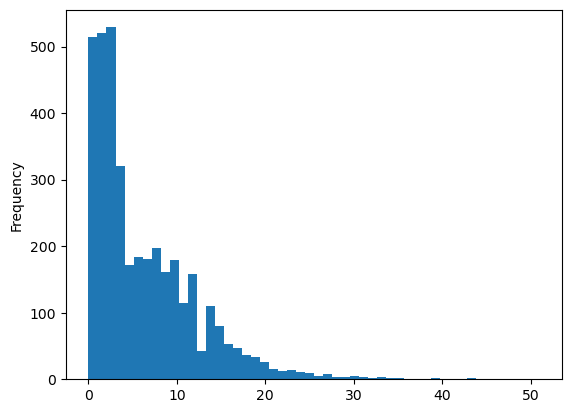

In [151]:
df['floorNum'].plot(kind='hist',bins=50)

<Axes: >

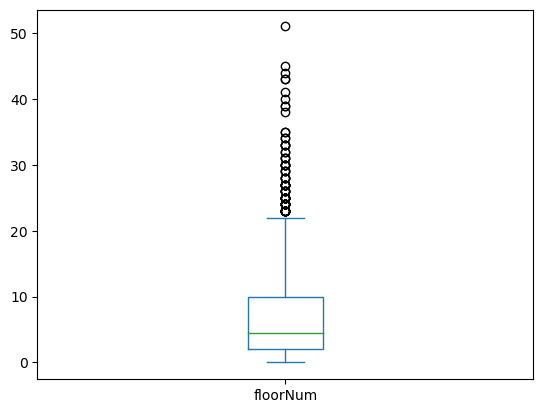

In [152]:
df['floorNum'].plot(kind='box')

In [153]:
df['floorNum'].skew()

1.7744822511085023

In [154]:
df['floorNum'].kurt()

4.873485153856596

<Axes: >

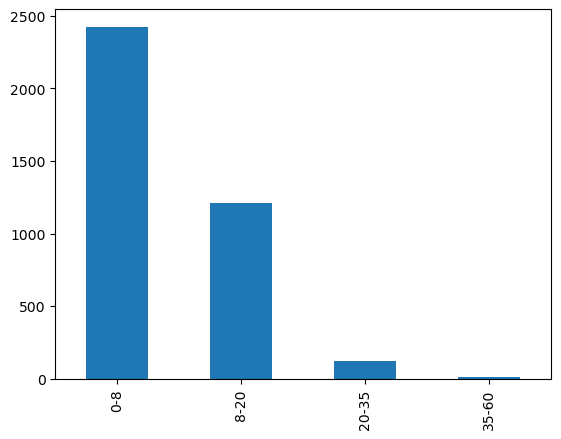

In [162]:
bins=[0,8,20,35,60]
bin_label=['0-8','8-20','20-35','35-60']
pd.cut(df['floorNum'],bins=bins,labels=bin_label,right=False).value_counts().sort_index().plot(kind='bar')

1) Their are 24 missing value present in floorNum column and contain 3772 non null values

2) Mean is 6.72 and sd is 5.97 which shows that mean is impacted by higher values 

3) Range of floor number are from 0 to 51 

4) Most of the data is ranging between 2,10

5) Data seems to be a right skew and kurtosis value is 4.87 which shows their are potential outliers present in data.

6) Their is significant drop after 20th floor 

7) after 21 floor their seem to be a potential outliers

In [163]:
df['luxury_score'].isna().sum()

0

In [164]:
df['luxury_score'].describe()

count   3796.00
mean      69.83
std       53.24
min        0.00
25%       29.00
50%       56.00
75%      108.00
max      174.00
Name: luxury_score, dtype: float64

In [165]:
df['luxury_score'].quantile([0.01,0.05,0.1,0.90,0.95,0.99])

0.01     0.00
0.05     0.00
0.10     0.00
0.90   157.00
0.95   174.00
0.99   174.00
Name: luxury_score, dtype: float64

<Axes: xlabel='luxury_score', ylabel='Count'>

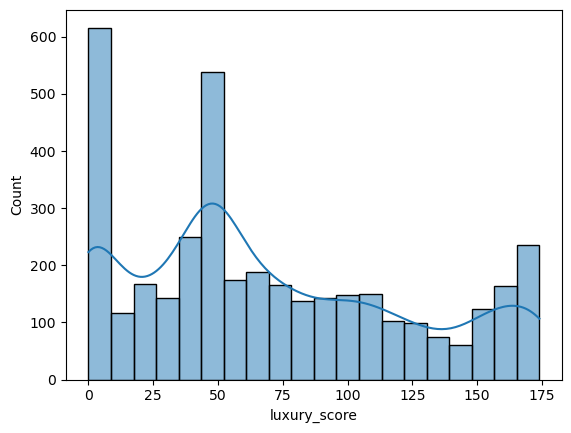

In [170]:
sns.histplot(df['luxury_score'],bins=20,kde=True)

<Axes: xlabel='luxury_score'>

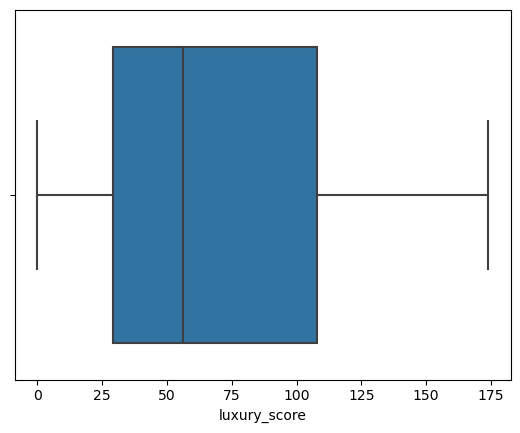

In [167]:
sns.boxplot(x=df['luxury_score'])

In [168]:
df['luxury_score'].skew()

0.4859729195454738

In [169]:
df['luxury_score'].kurt()

-0.8563693681172895

Data is following multinode distribution their is a peak around 50 and another peak was found near 160
Most of data is ranging between 29,108 seems no potential outliers